In [2]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [3]:
FOLDER=os.path.join("data","M27900-Overview-ASCII")
FOLDER=os.path.join("data","M27900-Zoom-ASCII")


In [4]:
def read_file(path):
    data=[]
    in_data=False
    w=0
    h=0
    with open(path,"r") as f:
        for line in f.read().split("\n"):
            if line.startswith("ImageWidth="):
                w=int(line.replace("ImageWidth=",""))
            if line.startswith("ImageHeight="):
                h=int(line.replace("ImageHeight=",""))
            if line.startswith("[Data]"):
                in_data=True
                continue
            if in_data:
                d=line.split("\t")[:w]
                data.append(d)
                if len(data)==h:
                    break
    data=np.array(data).astype(np.float)
    return data

full_data=[]
for f in sorted(os.listdir(FOLDER)):
    if f.endswith(".asc"):
        datafile=os.path.join(FOLDER,f)
        data = read_file(datafile)
        full_data.append(data)
full_data=np.array(full_data)

In [249]:
full_data.shape

(500, 640, 512)

In [288]:
a,b,c=0,0,0#200,300,0
red_full_data=full_data[73:91,200+106+a:,50+b:]

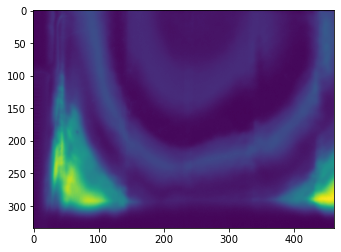

In [296]:
red_full_data = red_full_data - red_full_data[-1,:,:]
plt.imshow(red_full_data[0,:,:])

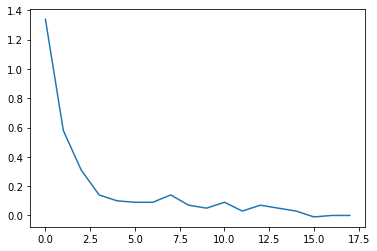

In [297]:
plt.plot(red_full_data[:,0,0])

In [367]:
from scipy.optimize import curve_fit

def biexp(x,a1,b1,a2,b2):
    return a1*np.exp(-b1*x) + a2*np.exp(-b2*x)

fit_data=np.zeros((4,red_full_data.shape[1],red_full_data.shape[2]))
xdata = np.arange(0, red_full_data.shape[0])
bounds=(np.array([-100,0,-100,0]),np.array([100,20,100,20]))
error_map=np.zeros((red_full_data.shape[1],red_full_data.shape[2]))
reg_map=np.zeros_like(red_full_data)

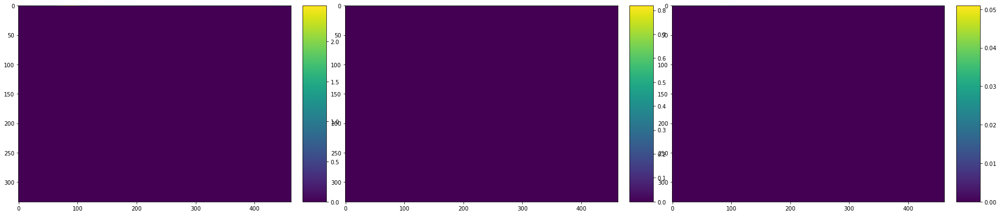

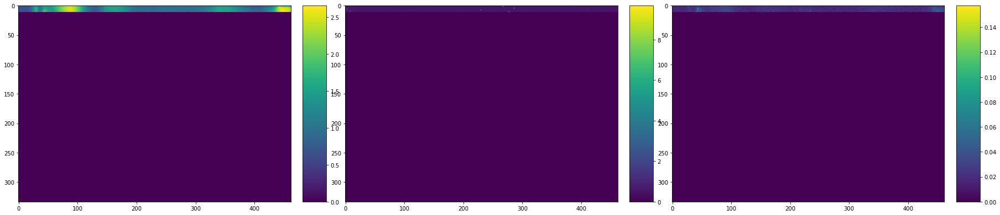

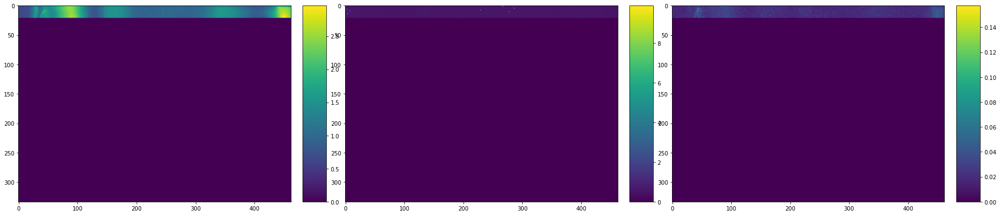

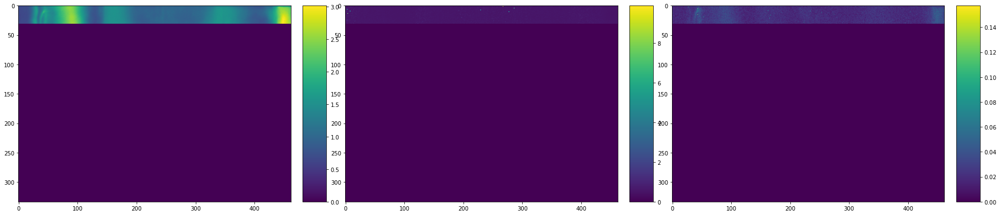

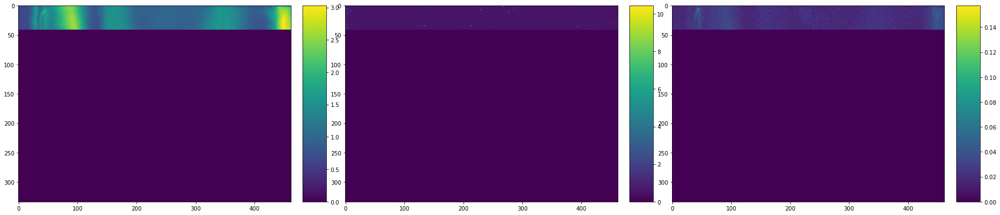

...

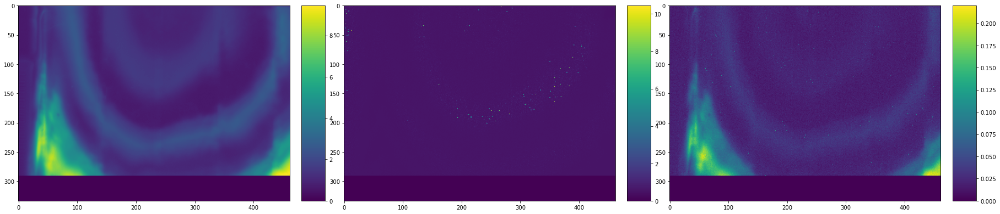

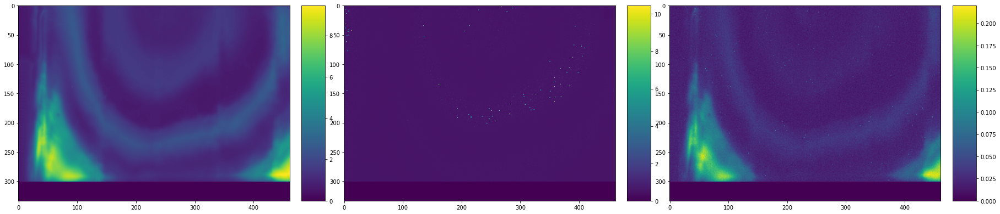

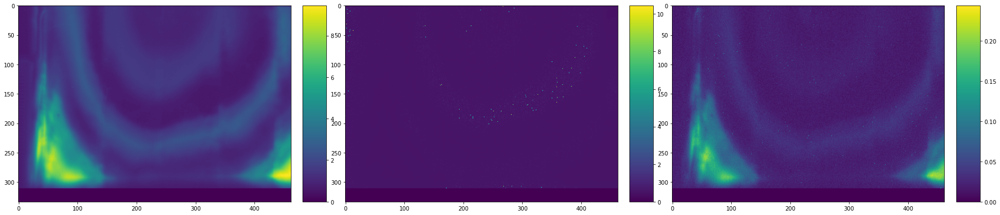

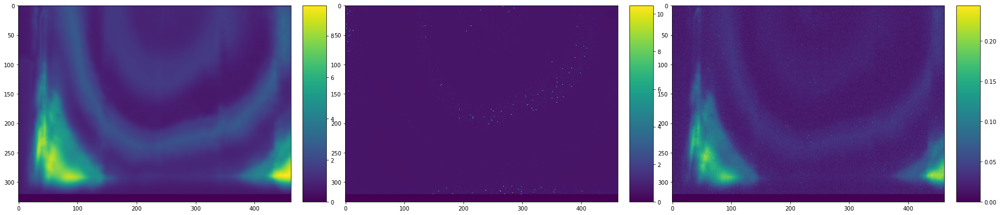

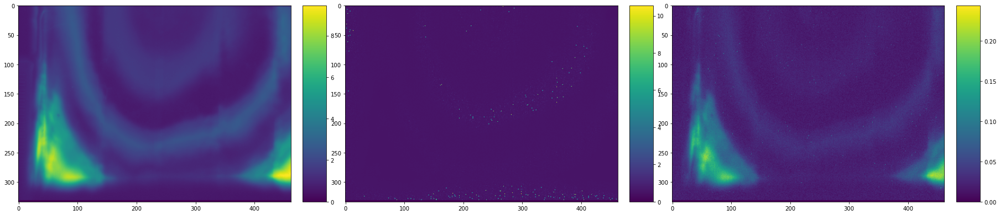

In [369]:
for x in range(red_full_data.shape[1]):
    for y in range(red_full_data.shape[2]):
        #print(x,y," "*5,end="\r")
        ydata = red_full_data[:,x,y]
        try:
            popt, pcov = curve_fit(biexp, xdata, ydata,
                                   bounds=bounds
                                  )
            sorder_args=np.argsort(popt[::2])
            popt[1::2]=popt[1::2][sorder_args]
            popt[::2]=popt[::2][sorder_args]
            #popt[0],popt[1],popt[2],popt[3]=popt[(0,2)].max(),popt[(0,2)].min(),
        except RuntimeError as e:
            popt=fit_data[:,x,y]*np.nan
        fit_data[:,x,y]=popt
        reg_map[:,x,y]=biexp(xdata,*fit_data[:,x,y])
    error_map[:x+1,:]=np.abs(red_full_data[:,:x+1,:]-reg_map[:,:x+1,:]).mean(0)
    if x%10==0:
        fig, axs = plt.subplots(1,3, figsize=(10*3, 10))
        for i in range(int(fit_data.shape[0]/2)):
            ax = axs.ravel()[i]#plt.subplot(100+fit_data.shape[0]*10+i+1)
            im = ax.imshow(fit_data[i::2,:,:].mean(0))
            cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])
            fig.colorbar(im, cax=cax)
            
        ax = axs.ravel()[i+1]
        im = ax.imshow(error_map)
        cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])
        fig.colorbar(im, cax=cax)
        
        plt.show()
        plt.close()

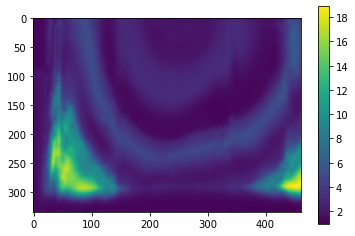

In [370]:
plt.imshow(reg_map[0])
plt.colorbar()

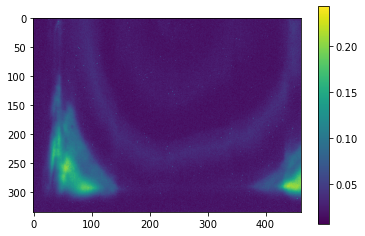

In [371]:
plt.imshow(error_map)
plt.colorbar()

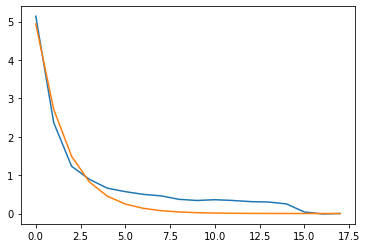

In [373]:
_,xmin,ymin = np.unravel_index(np.nanargmax(error_map), fit_data.shape)
plt.plot(red_full_data[:,xmin,ymin])
plt.plot(reg_map[:,xmin,ymin])

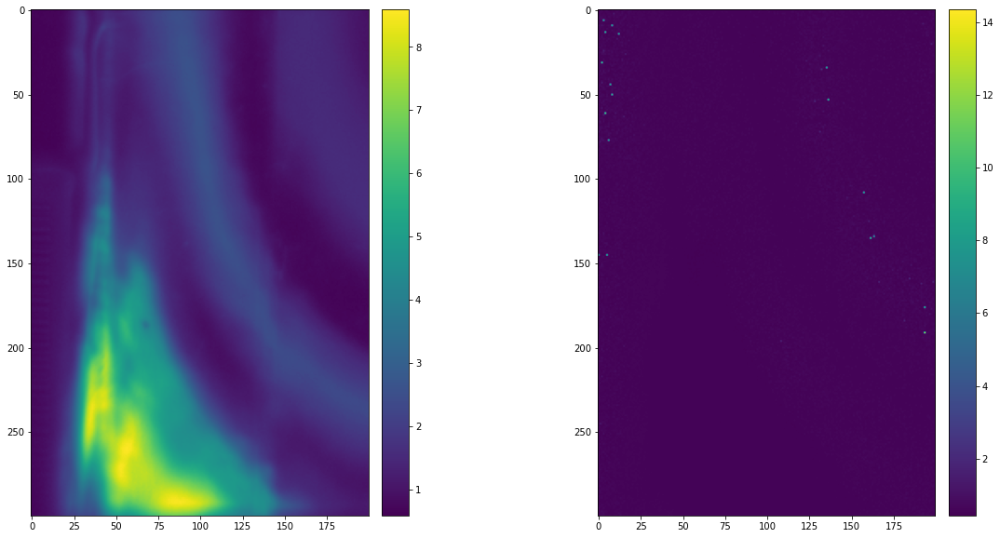

In [355]:
fig, axs = plt.subplots(1,2, figsize=(10*2, 10))
for i in range(int(fit_data.shape[0]/2)):
    ax = axs.ravel()[i]#plt.subplot(100+fit_data.shape[0]*10+i+1)
    _d=fit_data[i::2,:,:].mean(0)
    ut=np.nanmean(_d)+np.nanstd(_d)*4
    lt=np.nanmean(_d)-np.nanstd(_d)*4
    #_d[_d>ut]=ut
    #_d[_d<lt]=lt
    im = ax.imshow(_d[:300,:200])
    cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])
    fig.colorbar(im, cax=cax)
plt.show()
plt.close()

[34.22300323  0.59238742] [0.38846525 1.03153475]
[-0.09373851  0.84417021] [-0.01259093  1.28378064]


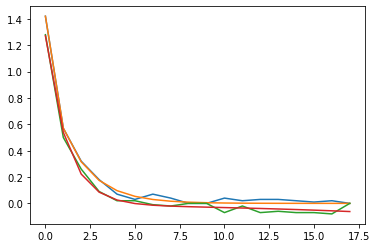

In [342]:
_,xmin,ymin = np.unravel_index(np.nanargmax(fit_data[1::2,:,:].mean(0)), fit_data.shape)
fit_data[:,xmin,ymin]
td=red_full_data[:,xmin,ymin]
plt.plot(td)
plt.plot(biexp(np.arange(td.shape[0]),*fit_data[:,xmin,ymin]))
print(fit_data[1::2,xmin,ymin],fit_data[0::2,xmin,ymin])

_,xmin,ymin = np.unravel_index(np.nanargmin(fit_data[1::2,:,:].mean(0)), fit_data.shape)
fit_data[:,xmin,ymin]
td=red_full_data[:,xmin,ymin]
plt.plot(td)
plt.plot(biexp(np.arange(td.shape[0]),*fit_data[:,xmin,ymin]))
print(fit_data[1::2,xmin,ymin],fit_data[0::2,xmin,ymin])

In [332]:
n_fit_data = fit_data.copy()
apos = n_fit_data[(0,2),:,:].argmax(0)
bpos = n_fit_data[(0,2),:,:].argmin(0)
#n_fit_data[1],n_fit_data[3]=(n_fit_data[(1,3),:]*apos).sum(0),(n_fit_data[(1,3),:]*bpos).sum(0)
#n_fit_data[0],n_fit_data[2]=(n_fit_data[(0,2),:]*apos).sum(0),(n_fit_data[(0,2),:]*bpos).sum(0)
#(n_fit_data[(1,3),:]*apos).sum(0).shape

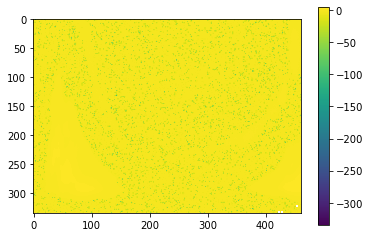

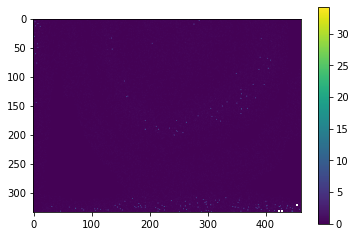

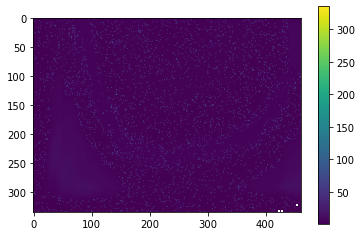

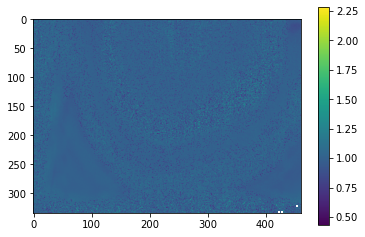

In [334]:
for data in n_fit_data[:,:,:]:
    #plt.figure(dpi=200)
    plt.imshow(data[:,:])
    plt.colorbar()
    plt.show()
    plt.close()

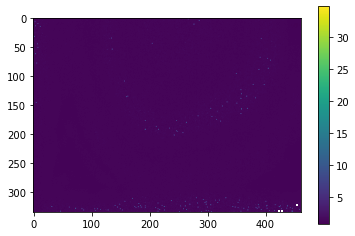

In [340]:
nfit = n_fit_data.copy()
#for i in range(0,nfit.shape[0],2):
    #nfit[i]-=np.nanmin(nfit[i])
    #nfit[i]/=np.nanmax(nfit[i])
nfit=nfit[(1,3),:,:].sum(0)
#nfit/=np.nanmax(nfit)
plt.imshow(nfit)
plt.colorbar()
plt.show()
plt.close()
#nfit=nfit/nfit.max(0)    
#nfit=nfit/nfit.max(0)

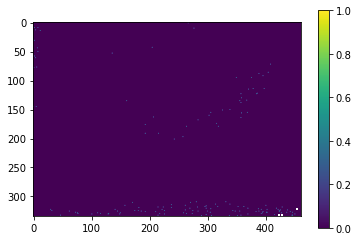

In [341]:
nfit = n_fit_data.copy()
for i in range(nfit.shape[0]):
    nfit[i]-=np.nanmin(nfit[i])
    nfit[i]/=np.nanmax(nfit[i])
nfit=nfit.sum(0)
nfit/=np.nanmax(nfit)
nfit[nfit<0.8]=0
plt.imshow(nfit)
plt.colorbar()
plt.show()
plt.close()
#nfit=nfit/nfit.max(0)    
#nfit=nfit/nfit.max(0)

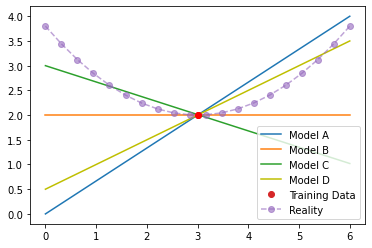

In [412]:
x=np.linspace(0,6,20)
plt.plot(x,x*2/3,label="Model A")
plt.plot(x,x*0+2,label="Model B")
plt.plot(x,x*-0.33+3,label="Model C")
plt.plot(x,x*1.5/3+0.5,"y",label="Model D")
plt.plot([3],[2],"o", label="Training Data")
plt.plot(x,((x-3)**2)/5+2,"o--",label="Reality",alpha=0.6)
plt.plot([3],[2],"or")

plt.legend()
